<center><h1>SARS-CoV-2 Outbreak Analysis</h1></center>

<center>By Ashish Agarwal</center>

<h2>Data Story</h2>

Resources:

- https://www.kaggle.com/sudalairajkumar/novel-corona-virus-2019-dataset
- https://www.kaggle.com/imdevskp/corona-virus-report
- https://www.kaggle.com/fanconic/covid-19-additional-statistics/data?
- https://www.kaggle.com/hamzael1/hospital-beds-by-country
- https://www.kaggle.com/winterpierre91/covid19-global-weather-data


<h4>Importing neccessary libraries for effiecient analysis</h4>

In [3]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

import datetime as dt
from datetime import timedelta

from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score, silhouette_samples
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.svm import SVR
from sklearn.metrics import mean_squared_error,mean_squared_log_error, r2_score, make_scorer
from sklearn.preprocessing import PolynomialFeatures

import scipy.cluster.hierarchy as sch

import statsmodels.api as sm
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf


import plotly.express as px
import plotly.offline as py
import plotly.graph_objs as go
from plotly.subplots import make_subplots
py.init_notebook_mode(connected= True)

from fbprophet import Prophet


import warnings
warnings.filterwarnings('ignore')

#### Loading and understanding 1st dataset of CoVID-19

In [4]:
df1= pd.read_csv(r'C:\Users\user\Desktop\Springboard\Capstone Project 1\New folder\Data\novel-coronavirus-in-india\covid_19_data.csv')
df1.head(5)

,SNo,ObservationDate,Province/State,Country/Region,Last Update,Confirmed,Deaths,Recovered
0,1,01/22/2020,Anhui,Mainland China,1/22/2020 17:00,1.0,0.0,0.0
1,2,01/22/2020,Beijing,Mainland China,1/22/2020 17:00,14.0,0.0,0.0
2,3,01/22/2020,Chongqing,Mainland China,1/22/2020 17:00,6.0,0.0,0.0
3,4,01/22/2020,Fujian,Mainland China,1/22/2020 17:00,1.0,0.0,0.0
4,5,01/22/2020,Gansu,Mainland China,1/22/2020 17:00,0.0,0.0,0.0


In [5]:
print('Shape of the dataset: \n', df1.shape,'\n\n')
print('Check for NULL values: \n', df1.isnull().sum(), '\n\n')
print('Datatype of each independent variable: ', df1.dtypes)

Shape of the dataset: 
 (35202, 8) 


Check for NULL values: 
 SNo                    0
ObservationDate        0
Province/State     16647
Country/Region         0
Last Update            0
Confirmed              0
Deaths                 0
Recovered              0
dtype: int64 


Datatype of each independent variable:  SNo                  int64
ObservationDate     object
Province/State      object
Country/Region      object
Last Update         object
Confirmed          float64
Deaths             float64
Recovered          float64
dtype: object


#### Data Preprocessing and Cleaning

In [6]:
df1.drop(["SNo"], 1, inplace= True)
df1.head(2)

,ObservationDate,Province/State,Country/Region,Last Update,Confirmed,Deaths,Recovered
0,01/22/2020,Anhui,Mainland China,1/22/2020 17:00,1.0,0.0,0.0
1,01/22/2020,Beijing,Mainland China,1/22/2020 17:00,14.0,0.0,0.0


In [7]:
# Converting the given date-time format into pandas provided datetime format

df1['ObservationDate']= pd.to_datetime(df1['ObservationDate'])
df1['Last Update']= pd.to_datetime(df1['Last Update'])
df1.head(2)

,ObservationDate,Province/State,Country/Region,Last Update,Confirmed,Deaths,Recovered
0,2020-01-22,Anhui,Mainland China,2020-01-22 17:00:00,1.0,0.0,0.0
1,2020-01-22,Beijing,Mainland China,2020-01-22 17:00:00,14.0,0.0,0.0


In [8]:
# Grouping the dataframe by 'ObservationDate' and 'Country/Region' and aggregating with 'Confirmed', 'Recovered' and 'Death' cases.

cou_grp= df1.groupby(['Country/Region','ObservationDate']).agg({
                                                "Confirmed": 'sum',
                                                "Recovered": 'sum',
                                                "Deaths": 'sum'
})

cou_grp.head(2)

,,Confirmed,Recovered,Deaths
Country/Region,ObservationDate,,,
Azerbaijan,2020-02-28,1.0,0.0,0.0
"('St. Martin',)",2020-03-10,2.0,0.0,0.0


In [9]:
# Adding a column of 'Active Cases' in the cou_grp dataframe
cou_grp['Active Cases']= cou_grp['Confirmed']- cou_grp['Recovered']- cou_grp['Deaths']

# applying and adding coumns for log transformation to 'Confirmed' and 'Active' columns in the cou_grp dataframe to initiate the removal of skewness in them if any.
cou_grp['log_confirmed']= np.log(cou_grp['Confirmed'])
cou_grp['log_active']= np.log(cou_grp['Active Cases'])

cou_grp.head(2)

,,Confirmed,Recovered,Deaths,Active Cases,log_confirmed,log_active
Country/Region,ObservationDate,,,,,,
Azerbaijan,2020-02-28,1.0,0.0,0.0,1.0,0.000000,0.000000
"('St. Martin',)",2020-03-10,2.0,0.0,0.0,2.0,0.693147,0.693147


#### Performing Datewise Analysis

In [10]:
# Creating a temporary dataframe by grouping different types of cases present in the new dataframe as per date and aggregating with 'Confirmed', 'Recovered' and 'Deaths' cases

date_wise= df1.groupby(['ObservationDate']).agg({
                            "Confirmed": 'sum',
                            "Recovered": 'sum',
                            "Deaths": 'sum'})

#Adding a column 'Days Since' in 'date_wise' dataframe to keep the count of the days from initial date

date_wise['Days Since']= date_wise.index- date_wise.index.min()

date_wise.head(2)

,Confirmed,Recovered,Deaths,Days Since
ObservationDate,,,,
2020-01-22,555.0,28.0,17.0,0 days
2020-01-23,653.0,30.0,18.0,1 days


Basic Information Extraction from 1st dataset

In [12]:
print("No. of Countries suffering: ",len(df1['Country/Region'].unique()))
print("Total Confirmed Cases worldwide:  ",date_wise['Confirmed'].iloc[-1])
print("Total Recovered Cases worldwide:  ",date_wise['Recovered'].iloc[-1])
print("Total Death Cases worldwide:  ",date_wise['Deaths'].iloc[-1])


print("Confirmed Cases/Day worldwide: ",np.round(date_wise['Confirmed'].iloc[-1]/date_wise.shape[0]))
print("Recovered Cases/Day worldwide: ",np.round(date_wise['Recovered'].iloc[-1]/date_wise.shape[0]))
print("Deaths Cases/Day worldwide: ",np.round(date_wise['Deaths'].iloc[-1]/date_wise.shape[0]))


print("Confirmed Cases/Hour worldwide: ",np.round(date_wise['Confirmed'].iloc[-1]/date_wise.shape[0]*24))
print("Recovered Cases/Hour worldwide: ",np.round(date_wise['Recovered'].iloc[-1]/date_wise.shape[0]*24))
print("Death Cases/Hour worldwide: ",np.round(date_wise['Deaths'].iloc[-1]/date_wise.shape[0]*24))


No. of Countries suffering:  223
Total Confirmed Cases worldwide:   6632985.0
Total Recovered Cases worldwide:   2869963.0
Total Death Cases worldwide:   391136.0
Confirmed Cases/Day worldwide:  49133.0
Recovered Cases/Day worldwide:  21259.0
Deaths Cases/Day worldwide:  2897.0
Confirmed Cases/Hour worldwide:  1179197.0
Recovered Cases/Hour worldwide:  510216.0
Death Cases/Hour worldwide:  69535.0


#### Distribution of number of Active cases worldwide

In [13]:
# Distribution of Number of Active Cases

fig= px.bar(x=date_wise.index, y=date_wise["Confirmed"]- date_wise["Recovered"]- date_wise["Deaths"])
fig.update_layout(title="Distribution of number of Active cases", xaxis_title="Date", yaxis_title="Number of Cases")
fig.show()

Active cases= No. of Confirmed Cases - No. of Recovered Cases- No. of Death Cases

So, it can be indirectly inferred that increase in active cases means there is probably a drop in the number of recovered and death cases.

#### Distribution of number of Closed cases worldwide

In [14]:
# Distribution of number of Closed cases

fig= px.bar(x= date_wise.index, y= date_wise['Recovered']+ date_wise['Deaths'])
fig.update_layout(title=" Distribution of number of Closed Cases", xaxis_title="Date", yaxis_title="Number of Cases")
fig.show()

Closed Cases= Number of Recovered cases + Number of Death Cases

So, Increase in number of closed cases also infer that more & more no. of pateints are getting recovered or more and more people are dying due to this virus.

#### Weekly Growth of Different types of cases (Recovered, Confirmed, Deaths) worldwide

In [15]:
date_wise["WeekOfYear"]= date_wise.index.weekofyear

week_num=[]
week_wise_confirmed= []
week_wise_recovered= []
week_wise_deaths= []

w=1

for i in list(date_wise["WeekOfYear"].unique()):
                        week_wise_confirmed.append(date_wise[date_wise['WeekOfYear']==i]["Confirmed"].iloc[-1])
                        week_wise_recovered.append(date_wise[date_wise['WeekOfYear']==i]["Recovered"].iloc[-1])
                        week_wise_deaths.append(date_wise[date_wise['WeekOfYear']==i]["Deaths"].iloc[-1])
                        week_num.append(w)
                        w+=1

fig= go.Figure()
fig.add_trace(go.Scatter(x= week_num, y= week_wise_confirmed, mode='lines+markers', name= 'Weekly Growth of Confirmed cases'))
fig.add_trace(go.Scatter(x= week_num, y= week_wise_recovered, mode='lines+markers', name= 'Weekly Growth of Recovered cases'))
fig.add_trace(go.Scatter(x= week_num, y= week_wise_deaths, mode='lines+markers', name= 'Weekly Growth of Death cases'))

fig.update_layout(title="Weekly Growth of Different types of Cases worldwide ", xaxis_title='Week Number', yaxis_title='Number of Cases', legend= dict(x=0, y=1, traceorder='normal'))
fig.show()                                                   
                

#### Weekly variation of confirmed and Death cases worldwide

Text(0.5, 1.0, 'Weekly variation in number of Death cases')

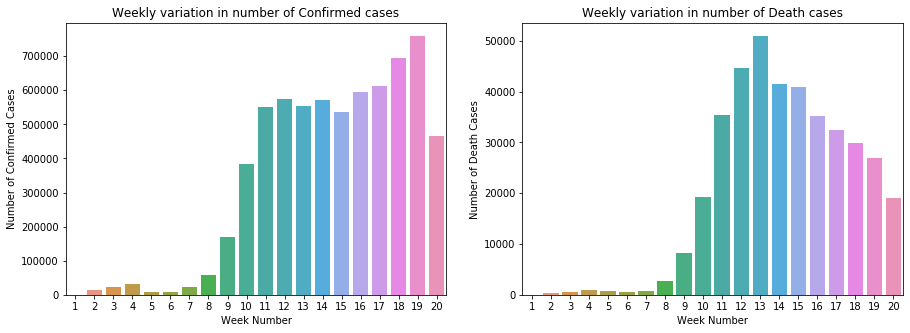

In [17]:
fig, (ax1, ax2)= plt.subplots(1,2, figsize=(15,5))

sns.barplot(x= week_num, y= pd.Series(week_wise_confirmed).diff().fillna(0), ax= ax1)
sns.barplot(x= week_num, y= pd.Series(week_wise_deaths).diff().fillna(0), ax= ax2)\

ax1.set_xlabel("Week Number")
ax1.set_ylabel("Number of Confirmed Cases")
ax1.set_title("Weekly variation in number of Confirmed cases")

ax2.set_xlabel("Week Number")
ax2.set_ylabel("Number of Death Cases")
ax2.set_title("Weekly variation in number of Death cases")

Looking at the graph for weekly variation in death cases, one can infer that the death toll got decreased at Week no. 14 and from Week 15 onwards, there can be seen a dip in the number of cases.The considerable decrease in death cases has somehow motivated us.

Looking at the variation of Confirmed cases(weekly), we can observe that there had been a dip during week 15 but then it is gradualy increasing. This may be due to relaxation of the lockdown but again there got a sharp decrease in the number of cases in week 20 which may be due to the partial imposition of curfew after office hours.

#### Trends of Confirmed, Recovered and Death Cases worldwide

In [18]:
# Growth of different types of the cases( Confirmed, Recovered, Deaths)

fig= go.Figure()

fig.add_trace(go.Scatter(x=date_wise.index, y=date_wise['Confirmed'], mode='lines+markers', name='Confirmed Cases'))
fig.add_trace(go.Scatter(x=date_wise.index, y=date_wise['Recovered'], mode='lines+markers', name='Recovered Cases'))
fig.add_trace(go.Scatter(x=date_wise.index, y=date_wise['Deaths'], mode='lines+markers', name='Death Cases'))

fig.update_layout(title=" Growth of Different types of cases", xaxis_title="Date", yaxis_title="Number of Cases", legend= dict(x=0, y=1, traceorder="normal"))
fig.show()
           

#### Daily variation of different types (Recovered, Confirmed, Deaths) of cases

In [20]:
print("Average Daily increase in number of Confirmed Cases: ", np.round(date_wise['Confirmed'].diff().fillna(0).mean()))
print("Average Daily increase in number of Recovered Cases: ", np.round(date_wise['Recovered'].diff().fillna(0).mean()))
print("Average Daily increase in number of Death Cases: ", np.round(date_wise['Deaths'].diff().fillna(0).mean()))

fig= go.Figure()
fig.add_trace(go.Scatter(x=date_wise.index, y= date_wise['Confirmed'].diff().fillna(0), mode='lines+markers', name='Confirmed cases'))
fig.add_trace(go.Scatter(x=date_wise.index, y= date_wise['Recovered'].diff().fillna(0), mode='lines+markers', name='Recovered cases'))
fig.add_trace(go.Scatter(x=date_wise.index, y= date_wise['Deaths'].diff().fillna(0), mode='lines+markers', name='Death cases'))

fig.update_layout(title='Daily variattion of different types (Recovered, Confirmed, Deaths) of cases', xaxis_title='Date', yaxis_title='Number of Cases', legend= dict(x=0,y=1, traceorder= 'normal'))
fig.show()

Average Daily increase in number of Confirmed Cases:  49129.0
Average Daily increase in number of Recovered Cases:  21259.0
Average Daily increase in number of Death Cases:  2897.0


One can observe from the above plot that the daily groth of confirmed cases are gradually increasing only but shows certain irregularity in its growth and this is amid the lockdown phase which is not a positive response.This shows people are not much frightened due to this pandemic as it has a low mortality rate and are continuing to disobey the strict imposition of rules and restriction.

Looking at the plot for Recovered cases, it has shown positive response amid the increase of confirmed cases.It has significantly took a positive slope with reduced variations than confirmed cases is approaching the trend to confirmed cases which is a positive thing

Lastly, with the trend of Death cases, it gives a sense of relief that it's still keeping a constant growth rate and is not increasing.But, our sole aim should be to bring it to zero and for that we need to follow the norms strictly.

#### 7 days rolling Mean of daily Increase of Confirmed, Recovered and Death Cases

In [21]:
fig= go.Figure()
fig.add_trace(go.Scatter(x=date_wise.index, y=date_wise['Confirmed'].diff().rolling(window=7).mean(), mode='lines+markers', name='Confirmed cases'))
fig.add_trace(go.Scatter(x=date_wise.index, y=date_wise['Recovered'].diff().rolling(window=7).mean(), mode='lines+markers', name='Recovered cases'))
fig.add_trace(go.Scatter(x=date_wise.index, y=date_wise['Deaths'].diff().rolling(window=7).mean(), mode='lines+markers', name='Death cases'))

fig.update_layout(title='7 days rolling Mean of daily Increase of Confirmed, Recovered and Death Cases', xaxis_title='Date', yaxis_title='Number of Cases', legend=dict(x=0,y=1, traceorder='normal'))
fig.show()

In [28]:
# Proportion of countries in confirmed, recovered and death cases

last_day_country_wise['Proportion got Confirmed']= (last_day_country_wise['Last 24 Hours Confirmed']/(date_wise['Confirmed'].iloc[-1]- date_wise['Confirmed'].iloc[-2]))*100
last_day_country_wise['Proportion got Recovered']= (last_day_country_wise['Last 24 Hours Recovered']/(date_wise['Recovered'].iloc[-1]- date_wise['Recovered'].iloc[-2]))*100
last_day_country_wise['Proportion got dead']= (last_day_country_wise['Last 24 Hours Deaths']/(date_wise['Deaths'].iloc[-1]- date_wise['Deaths'].iloc[-2]))*100


last_day_country_wise[['Country Name', 'Proportion got Confirmed', 'Proportion got Recovered', 'Proportion got dead']].sort_values(['Proportion got Confirmed', 'Proportion got Recovered', 'Proportion got dead'], ascending= False).style.background_gradient(cmap="Reds")

,Country Name,Proportion got Confirmed,Proportion got Recovered,Proportion got dead
1,Brazil,24.8693,25.155,28.387
0,US,17.0004,8.83951,19.9653
6,India,7.95255,6.73889,5.29967
2,Russia,7.0953,13.2931,3.23762
16,Pakistan,3.86088,1.85439,1.58027
12,Chile,3.7507,-0.461673,1.56099
13,Mexico,3.57218,3.19786,15.7256
9,Peru,3.44511,6.0156,2.6402
11,Iran,2.87415,3.50718,1.13702
25,South Africa,2.62726,2.50689,1.07921


#### Mortality and Recovery Rate Analysis

In [19]:
# Calculation of Mortality Rate and Recovery Rate

date_wise['Mortality Rate']= (date_wise['Deaths']/date_wise['Confirmed'])*100
date_wise['Recovery Rate']= (date_wise['Recovered']/date_wise['Confirmed'])*100
date_wise['Active Cases']= date_wise['Confirmed']- date_wise['Recovered']- date_wise['Deaths']
date_wise['Closed Cases']= date_wise['Recovered']+ date_wise['Deaths']

print("Average Mortality Rate :", date_wise['Mortality Rate'].mean())
print("Median Mortality Rate :", date_wise['Mortality Rate'].median())
print("Average Recovery Rate :", date_wise['Recovery Rate'].mean())
print("Median Recovery Rate :", date_wise['Recovery Rate'].median())

# Plotting Mortality and Recoevry Rate

fig= make_subplots(rows=2, cols=1, subplot_titles=("Recovery Rate", "Mortality Rate"))

fig.add_trace(
    go.Scatter(x=date_wise.index, y=(date_wise["Recovered"]/date_wise["Confirmed"])*100,name="Recovery Rate"),
    row=1, col=1
)
fig.add_trace(
    go.Scatter(x=date_wise.index, y=(date_wise["Deaths"]/date_wise["Confirmed"])*100,name="Mortality Rate"),
    row=2, col=1
)

fig.update_layout(height=1000, legend=dict(x=0, y=1, traceorder='normal'))
fig.update_xaxes(title_text="Date", row=1, col=1)
fig.update_yaxes(title_text="Recovery Rate", row=1, col=1)
fig.update_xaxes(title_text="Date", row=1, col=2)
fig.update_yaxes(title_text="Mortality Rate", row=1, col=2)
fig.show()

Average Mortality Rate : 4.7942924741483415
Median Mortality Rate : 4.710889549254311
Average Recovery Rate : 28.48110932354963
Median Recovery Rate : 29.134789961214548


Mortality Rate= (Number of Death cases/ Number of Confirmed Cases)X100 Recovery Rate= (Number of Recovered cases / Number of Confirmed cases)X100

From the above graphs one can infer that the recovery rate has picked up after a significant rise from early April due to complete lockdowns followed by most of the countries which is a good sign and the mortality rate is maintaining to be in single digits (around 6) which is also a positive response and has shown improvement from early May.

#### Datewise Growth Factor of Active and Closed Cases worldwide

In [22]:
fig= go.Figure()
fig.add_trace(go.Scatter(x=date_wise.index, y=(date_wise['Confirmed']-date_wise['Recovered']- date_wise['Deaths'])/(date_wise['Confirmed']-date_wise['Recovered']- date_wise['Deaths']).shift(), mode='lines', name=' Growth factor of Active cases'))
fig.add_trace(go.Scatter(x=date_wise.index, y=(date_wise['Recovered']+ date_wise['Deaths'])/(date_wise['Recovered']+date_wise['Deaths']).shift(), mode='lines', name=' Growth factor of Closed cases'))

fig.update_layout(title='Datewise Growth Factor of Active and Closed Cases', xaxis_title='Date', yaxis_title='Growth Factor', legend=dict(x=0,y=1, traceorder='normal'))
fig.show()

Growth Factor= ( New day(Confirmed+Recovered+Deaths)/Previous day(Confirmed+Recovered+Deaths)

Some important info reagrding Growth factor:

Greater than 1 : increase in corresponding cases
Greater than 1 but trending downward: Positive Sign but it's still in exponential growth
Equalds to 1 : Contant and no change in any type of cases


As, it can be seen the Growth factor for all the different types of cases remains above 1 which is an indication that it's still in exponential groth phase but its relieving to observe that there is no uphill trend post March end and is lying close to 1 only throught the time period.

#### Countrywise Mortality and Recovery Rate Analysis

In [24]:
# Calculation of Countrywise mortality and recovery rate

country_wise= df1[df1['ObservationDate']== df1['ObservationDate'].max()].groupby(['Country/Region']).agg({
    "Confirmed": 'sum',
    "Recovered": 'sum',
    "Deaths": 'sum'
}).sort_values(['Confirmed'], ascending= False)

# adding two more columns to the country_wise dataframe named 'Mortality' and 'Recovery' which will be keeping the values of Recovery and Mortality rate.

country_wise['Mortality']= (country_wise['Deaths']/country_wise['Confirmed'])*100
country_wise['Recovery']= (country_wise['Recovered']/country_wise['Confirmed'])*100

In [25]:
country_wise_last_24_confirmed=[]
country_wise_last_24_recovered=[]
country_wise_last_24_deaths=[]

for country in country_wise.index:
    country_wise_last_24_confirmed.append((cou_grp.loc[country].iloc[-1]- cou_grp.loc[country].iloc[-2])['Confirmed'])
    country_wise_last_24_recovered.append((cou_grp.loc[country].iloc[-1]- cou_grp.loc[country].iloc[-2])['Recovered'])
    country_wise_last_24_deaths.append((cou_grp.loc[country].iloc[-1]- cou_grp.loc[country].iloc[-2])['Deaths'])

In [26]:
last_day_country_wise= pd.DataFrame(list(zip(country_wise.index, country_wise_last_24_confirmed, country_wise_last_24_recovered, country_wise_last_24_deaths)),
                                    columns=["Country Name", "Last 24 Hours Confirmed", "Last 24 Hours Recovered", "Last 24 Hours Deaths"])

Text(0.5, 1.0, 'Top 15 Countries with highest number of Death cases in last 24 hours')

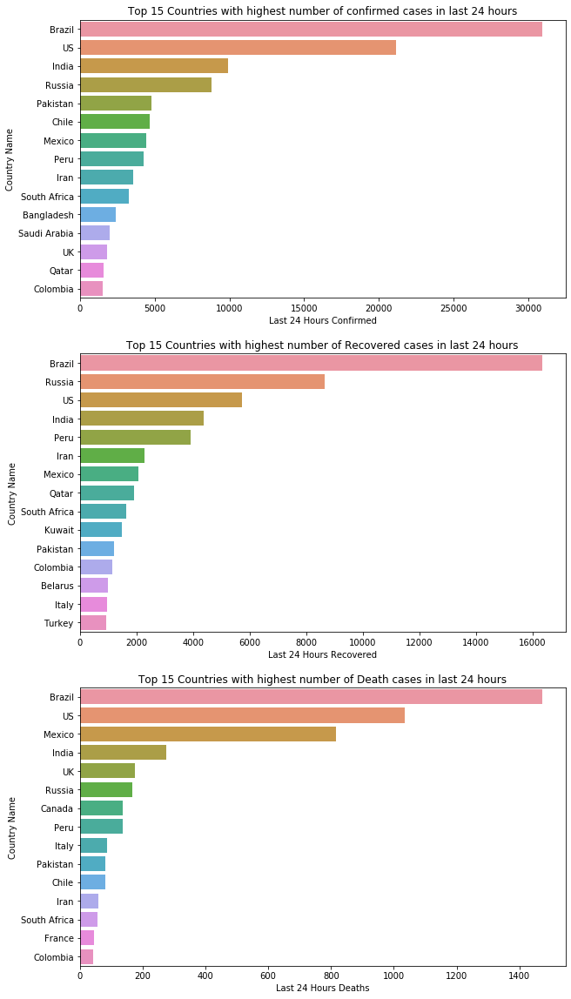

In [27]:
top_15_confirmed_last24= last_day_country_wise.sort_values(['Last 24 Hours Confirmed'], ascending= False).head(15)
top_15_recovered_last24= last_day_country_wise.sort_values(['Last 24 Hours Recovered'], ascending= False).head(15)
top_15_deaths_last24= last_day_country_wise.sort_values(['Last 24 Hours Deaths'], ascending= False).head(15)


fig, (ax1, ax2, ax3)= plt.subplots(3,1, figsize=(10,20))

sns.barplot(x= top_15_confirmed_last24['Last 24 Hours Confirmed'], y=top_15_confirmed_last24['Country Name'], ax= ax1)
ax1.set_title("Top 15 Countries with highest number of confirmed cases in last 24 hours")

sns.barplot(x= top_15_recovered_last24['Last 24 Hours Recovered'], y=top_15_recovered_last24['Country Name'], ax= ax2)
ax2.set_title("Top 15 Countries with highest number of Recovered cases in last 24 hours")

sns.barplot(x= top_15_deaths_last24['Last 24 Hours Deaths'], y=top_15_deaths_last24['Country Name'], ax= ax3)
ax3.set_title("Top 15 Countries with highest number of Death cases in last 24 hours")

In [29]:
# Proportion of countries in confirmed, recovered and death cases

last_day_country_wise['Proportion got Confirmed']= (last_day_country_wise['Last 24 Hours Confirmed']/(date_wise['Confirmed'].iloc[-1]- date_wise['Confirmed'].iloc[-2]))*100
last_day_country_wise['Proportion got Recovered']= (last_day_country_wise['Last 24 Hours Recovered']/(date_wise['Recovered'].iloc[-1]- date_wise['Recovered'].iloc[-2]))*100
last_day_country_wise['Proportion got dead']= (last_day_country_wise['Last 24 Hours Deaths']/(date_wise['Deaths'].iloc[-1]- date_wise['Deaths'].iloc[-2]))*100


last_day_country_wise[['Country Name', 'Proportion got Confirmed', 'Proportion got Recovered', 'Proportion got dead']].sort_values(['Proportion got Confirmed', 'Proportion got Recovered', 'Proportion got dead'], ascending= False).style.background_gradient(cmap="Reds")

,Country Name,Proportion got Confirmed,Proportion got Recovered,Proportion got dead
1,Brazil,24.8693,25.155,28.387
0,US,17.0004,8.83951,19.9653
6,India,7.95255,6.73889,5.29967
2,Russia,7.0953,13.2931,3.23762
16,Pakistan,3.86088,1.85439,1.58027
12,Chile,3.7507,-0.461673,1.56099
13,Mexico,3.57218,3.19786,15.7256
9,Peru,3.44511,6.0156,2.6402
11,Iran,2.87415,3.50718,1.13702
25,South Africa,2.62726,2.50689,1.07921


Text(0.5, 1.0, 'Top 15 countries as per no. of Death Cases')

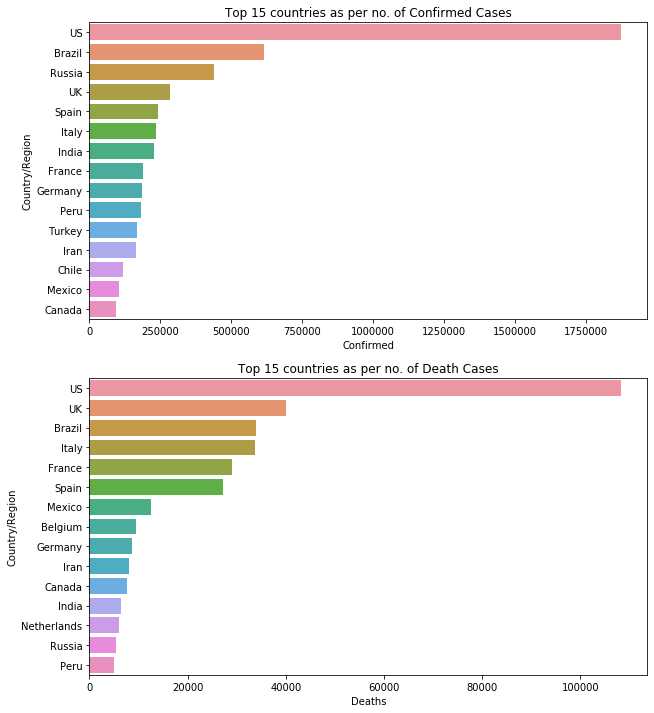

In [30]:
# Top 15 Countries as per number of confirmed and death cases

fig, (ax1, ax2)= plt.subplots(2,1, figsize=(10,12))

top_15_countries_confirmed= country_wise.sort_values(['Confirmed'], ascending= False).head(15)
top_15_countries_deaths= country_wise.sort_values(['Deaths'], ascending= False).head(15)

sns.barplot(x= top_15_countries_confirmed['Confirmed'], y= top_15_countries_confirmed.index, ax=ax1)
sns.barplot(x= top_15_countries_deaths['Deaths'], y= top_15_countries_deaths.index, ax=ax2)

ax1.set_title("Top 15 countries as per no. of Confirmed Cases")
ax2.set_title("Top 15 countries as per no. of Death Cases")

Text(0.5, 0, 'Recovery (%)')

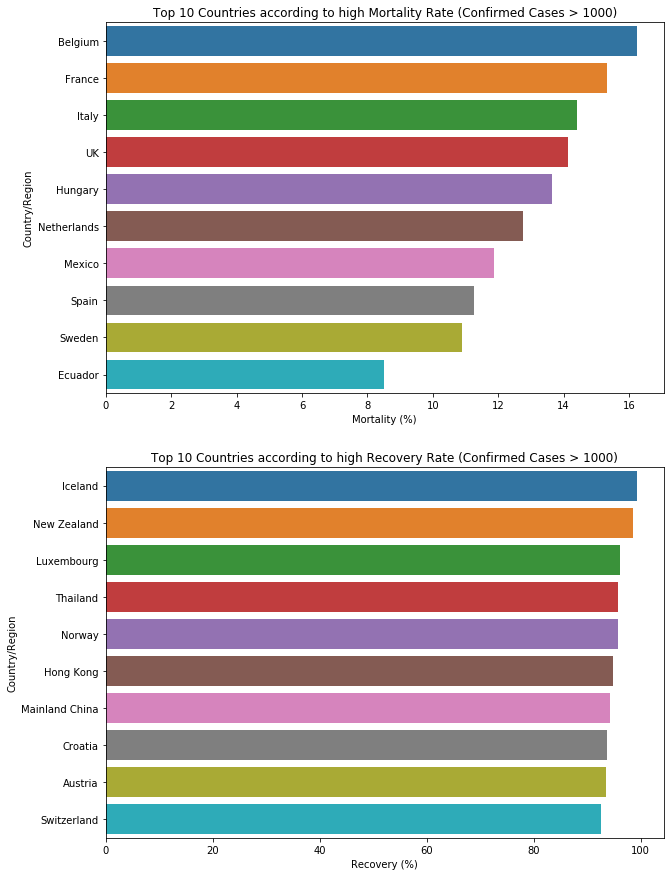

In [31]:
# Top 10 Countries as per Mortality and Recovery Rate with more than 1000 Confirmed cases

fig, (ax1, ax2)= plt.subplots(2,1, figsize=(10,15))

mortality_country_wise= country_wise[country_wise['Confirmed']>1000].sort_values(['Mortality'], ascending= False).head(10)
recovery_country_wise= country_wise[country_wise['Confirmed']>1000].sort_values(['Recovery'], ascending= False).head(10)

sns.barplot(x= mortality_country_wise['Mortality'], y=mortality_country_wise.index, ax= ax1)
sns.barplot(x= recovery_country_wise['Recovery'], y=recovery_country_wise.index, ax= ax2)

ax1.set_title("Top 10 Countries according to high Mortality Rate (Confirmed Cases > 1000)")
ax2.set_title("Top 10 Countries according to high Recovery Rate (Confirmed Cases > 1000)")

ax1.set_xlabel("Mortality (%)")
ax2.set_xlabel("Recovery (%)")


Mean of Survival Probability:  96.51480998851594
Median of Survival Probability:  97.59736670360245
Mean of Death Probability:  3.4851900114840646
Median of Death Probability:  2.4026332963975534


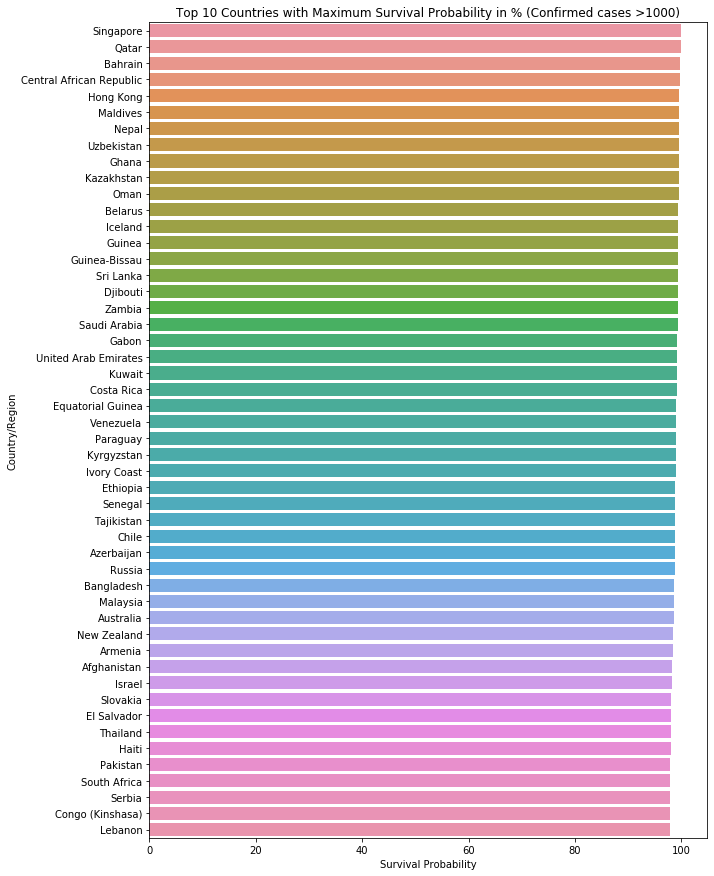

In [32]:
# Top 10 Countries as per Survival Probability

fig, (ax1)= plt.subplots(1,1, figsize=(10,15))

country_wise['Survival Probability']=(1-(country_wise['Deaths']/country_wise['Confirmed']))*100

top_10_countries_sur_prob= country_wise[country_wise['Confirmed']> 1000].sort_values(['Survival Probability'], ascending=False).head(50)

sns.barplot(x=top_10_countries_sur_prob['Survival Probability'], y=top_10_countries_sur_prob.index, ax=ax1)
ax1.set_title("Top 10 Countries with Maximum Survival Probability in % (Confirmed cases >1000)")

print("Mean of Survival Probability: ", country_wise['Survival Probability'].mean())
print("Median of Survival Probability: ", country_wise['Survival Probability'].median())
print("Mean of Death Probability: ", 100-country_wise['Survival Probability'].mean())
print("Median of Death Probability: ", 100-country_wise['Survival Probability'].median())


This is a positive sign as almost all countries have Survival Probability of more than 95%

#### Transition of some worstly affected countries with Active vs Confirmed cases

In [33]:
fig= go.Figure()

for country in country_wise.head(10).index:
    fig.add_trace(go.Scatter(x=cou_grp.ix[country]['log_confirmed'], y= cou_grp.ix[country]['log_active'], mode='lines', name= country))
    fig.update_layout(height=600, title='Transition of some worstly affected countries with Active vs Confirmed cases',
                     xaxis_title='Confirmed Cases (Log Scale)', yaxis_title='Active Cases (log Scale)', legend= dict(x=0, y=1, traceorder='normal'))

fig.show()


From this above graph one can infer that, most of the countries are following the trajectory similarly i.e. in uncontrolled Exponential Growth.Some of the countries like Spain, Italy, Germany, Turkey are starting to get control over it as we can see a dip of the curve for them. Countries like USA, Russia, UK are still in exponential growth.

## Analysis of India

In [34]:
data_india= df1[df1['Country/Region']== 'India']
date_wise_india= data_india.groupby(['ObservationDate']).agg({"Confirmed": 'sum', "Recovered":'sum', "Deaths": 'sum'})

print(date_wise_india.iloc[-1])

print("Total Active Cases: ", date_wise_india['Confirmed'].iloc[-1]-date_wise_india['Recovered'].iloc[-1]- date_wise_india['Deaths'].iloc[-1])
print("Total Closed Cases: ", date_wise_india['Recovered'].iloc[-1]+ date_wise_india['Deaths'].iloc[-1])

Confirmed    226713.0
Recovered    108450.0
Deaths         6363.0
Name: 2020-06-04 00:00:00, dtype: float64
Total Active Cases:  111900.0
Total Closed Cases:  114813.0


In [35]:
# Growth of different types of cases in India

fig= go.Figure()

fig.add_trace(go.Scatter(x= date_wise_india.index, y=date_wise_india['Confirmed'], mode='lines+markers', name='Confirmed Cases'))
fig.add_trace(go.Scatter(x= date_wise_india.index, y=date_wise_india['Recovered'], mode='lines+markers', name='Recovered Cases'))
fig.add_trace(go.Scatter(x= date_wise_india.index, y=date_wise_india['Deaths'], mode='lines+markers', name='Death Cases'))

fig.update_layout(title='Growth of different types of cases in India', xaxis_title='Date', yaxis_title='Number of Cases', legend=dict(x=0, y=1, traceorder='normal'))
fig.show()

In [36]:
# Distribution of Active Cases in India

fig= px.bar(x= date_wise_india.index, y= date_wise_india['Confirmed']- date_wise_india['Recovered']- date_wise_india['Deaths'])
fig.update_layout(title='Distribution of Active Cases in India', xaxis_title='Date', yaxis_title='Number of Cases')
fig.show()

In [37]:
# Datewise Growth factors of different cases in India

ind_confirm_inc=[]
ind_recover_inc=[]
ind_death_inc=[]

for i in range(date_wise_india.shape[0]-1):
    ind_confirm_inc.append(((date_wise_india['Confirmed'].iloc[i+1])/date_wise_india['Confirmed'].iloc[i]))
    ind_recover_inc.append(((date_wise_india['Recovered'].iloc[i+1])/date_wise_india['Recovered'].iloc[i]))
    ind_death_inc.append(((date_wise_india['Deaths'].iloc[i+1])/date_wise_india['Deaths'].iloc[i]))
    
    
ind_confirm_inc.insert(0,1)
ind_recover_inc.insert(0,1)
ind_death_inc.insert(0,1)

fig= go.Figure()

fig.add_trace(go.Scatter(x=date_wise_india.index, y= ind_confirm_inc, mode='lines', name='Growth of Confirmed Cases'))
fig.add_trace(go.Scatter(x=date_wise_india.index, y= ind_recover_inc, mode='lines', name='Growth of Recovered Cases'))
fig.add_trace(go.Scatter(x=date_wise_india.index, y= ind_death_inc, mode='lines', name='Growth of Death Cases'))


fig.update_layout(title='Datewise Growth Factor of different types cases in India', xaxis_title='Date', yaxis_title='Growth Factor', legend= dict(x=0, y=1, traceorder='normal'))
fig.show()

In [38]:
# Daily increase in Different types of cases in India

fig= go.Figure()

fig.add_trace(go.Scatter(x= date_wise_india.index, y= date_wise_india['Confirmed'].diff().fillna(0), mode= 'lines+markers', name='Confirmed Cases'))
fig.add_trace(go.Scatter(x= date_wise_india.index, y= date_wise_india['Recovered'].diff().fillna(0), mode= 'lines+markers', name='Recovered Cases'))
fig.add_trace(go.Scatter(x= date_wise_india.index, y= date_wise_india['Deaths'].diff().fillna(0), mode= 'lines+markers', name='Death Cases'))

fig.update_layout(title='Daily Variation of Different types of cases in India', xaxis_title='Dates', yaxis_title='Number of Cases', legend= dict(x=0, y=1, traceorder='normal'))
fig.show()

Text(0.5, 1.0, "India's week wise variatioin in Death cases")

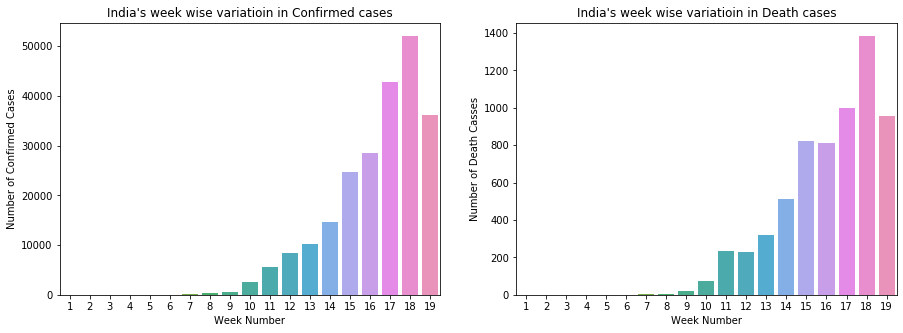

In [39]:
# India's week wisie variatioin in confirmed and death cases

date_wise_india['WeekOfYear']= date_wise_india.index.weekofyear


week_num_india=[]

ind_confirm_weekwise=[]
ind_recover_weekwise=[]
ind_death_weekwise=[]
w=1

for i in list(date_wise_india['WeekOfYear'].unique()):
    ind_confirm_weekwise.append(date_wise_india[date_wise_india['WeekOfYear']==i]['Confirmed'].iloc[-1])
    ind_recover_weekwise.append(date_wise_india[date_wise_india['WeekOfYear']==i]['Recovered'].iloc[-1])
    ind_death_weekwise.append(date_wise_india[date_wise_india['WeekOfYear']==i]['Deaths'].iloc[-1])
    week_num_india.append(w)
    w+=1
    

fig, (ax1, ax2)= plt.subplots(1,2, figsize=(15,5))

sns.barplot(x=week_num_india, y= pd.Series(ind_confirm_weekwise).diff().fillna(0), ax= ax1)
sns.barplot(x=week_num_india, y= pd.Series(ind_death_weekwise).diff().fillna(0), ax= ax2)

ax1.set_xlabel("Week Number")
ax2.set_xlabel("Week Number")

ax1.set_ylabel("Number of Confirmed Cases")
ax2.set_ylabel("Number of Death Casses")

ax1.set_title("India's week wise variatioin in Confirmed cases")
ax2.set_title("India's week wise variatioin in Death cases")

We will now look into the gradual changes in different cases of the transmission of Coronavirus worldwide using a 2nd dataframe.


In [40]:
# Reading the dataset

df2= pd.read_csv(r'C:\Users\user\Desktop\Springboard\Capstone Project 1\New folder\Data\COVID-19 Dataset\covid_19_clean_complete.csv', parse_dates=['Date'])
df2.head(5)

,Province/State,Country/Region,Lat,Long,Date,Confirmed,Deaths,Recovered,Active,WHO Region
0,NaN,Afghanistan,33.0000,65.0000,2020-01-22,0,0.0,0,0.0,Eastern Mediterranean
1,NaN,Albania,41.1533,20.1683,2020-01-22,0,0.0,0,0.0,Europe
2,NaN,Algeria,28.0339,1.6596,2020-01-22,0,0.0,0,0.0,Africa
3,NaN,Andorra,42.5063,1.5218,2020-01-22,0,0.0,0,0.0,Europe
4,NaN,Angola,-11.2027,17.8739,2020-01-22,0,0.0,0,0.0,Africa


In [41]:
# Data Preprocessing and Cleaning

cases= ['Confirmed', 'Recovered', 'Active', 'Deaths']

df2['Active']= df2['Confirmed']- df2['Recovered']- df2['Deaths']

# Filling missing values

df2[['Province/State']]= df2[['Province/State']].fillna('')
df2[cases]= df2[cases].fillna(0)

# Latest trends

df2_latest= df2[df2['Date']== max(df2['Date'])].reset_index()
df2_grouped= df2_latest.groupby('Country/Region')['Confirmed', 'Recovered', 'Active', 'Deaths'].sum().reset_index()

In [42]:
df2_temp= df2_grouped.sort_values(by=['Confirmed', 'Recovered', 'Deaths', 'Active'], ascending=False)
df2_temp= df2_temp.reset_index(drop= True)
df2_temp.style.background_gradient(cmap='Reds')

,Country/Region,Confirmed,Recovered,Active,Deaths
0,US,1960897,518522,1.33138e+06,110990
1,Brazil,707412,378257,292021,37134
2,Russia,476043,230226,239854,5963
3,United Kingdom,288834,1255,246900,40679
4,India,265928,129095,129360,7473
5,Spain,241717,150376,64205,27136
6,Italy,235278,166584,34730,33964
7,Peru,199696,89556,104569,5571
8,France,191313,71182,90919,29212
9,Germany,186109,169556,7858,8695


In [43]:
# Time Series plot to observe the spread

fig= go.Figure()

fig.add_trace(go.Scatter(x=df2.Date,
                         y=df2['Confirmed'],
                         name='Confirmed',
                         line_color='orange',
                         opacity=0.8))

fig.add_trace(go.Scatter(x=df2.Date,
                         y=df2['Recovered'],
                         name='Recovered',
                         line_color='blue',
                         opacity=0.8))

fig.add_trace(go.Scatter(x=df2.Date,
                         y=df2['Deaths'],
                         name='Deaths',
                         line_color='green',
                         opacity=0.8))

fig.add_trace(go.Scatter(x=df2.Date,
                         y=df2['Active'],
                         name='Active',
                         line_color='pink',
                         opacity=0.8))

fig.update_layout(title= 'Time Series for Confirmed, Recovered, Death and Active Cases', xaxis_rangeslider_visible= True)
fig.show()

In [44]:
# Progression of spread across the globe

df2_formatted= df2.groupby(['Date', 'Country/Region'])['Confirmed', 'Recovered', 'Deaths'].max().reset_index()
df2_formatted['Date']= pd.to_datetime(df2_formatted['Date']).dt.strftime('%m-%d-%Y')
df2_formatted['size']= df2_formatted['Confirmed'].pow(0.3)

fig= px.scatter_geo(df2_formatted, locations='Country/Region',
                    locationmode='country names',
                    color='Confirmed', size='size',
                    hover_name='Country/Region',
                    projection='natural earth',
                    range_color= [0, max(df2_formatted['Confirmed'])+2],
                    animation_frame='Date',
                    title='Progression of spread of COVID-19')

fig.update(layout_coloraxis_showscale= False)
fig.show()

It seems the spread is much more than in the temperate zone of world compared to tropical zones and the drier parts of the world has lesser prone to transmission.

### Analysis of CoVID-19 using physical natural and man-made features

In [45]:
# defining small functions to convert the datatype of some of the features

def p2f(x):
    
    try:
        return float(x.strip('%'))/100
    except:
        return np.nan

def age2int(x):
    
    try:
        return int(x)
    except:
        return np.nan

def fert2float(x):
   
    try:
        return float(x)
    except:
        return np.nan

# Reading the dataset for features like population, density, fertility rate, median age, urban population for modeling. 

df_country = pd.read_csv(r"C:\Users\user\Desktop\Springboard\Capstone Project 1\New folder\Data\population-data-covid-19/population_by_country_2020.csv", converters={'Urban Pop %':p2f,
                                                                                                             'Fert. Rate':fert2float,
                                                                                                             'Med. Age':age2int})
df_country.rename(columns={'Country (or dependency)': 'Country/Region',
                             'Population (2020)' : 'Population',
                             'Density (P/Km²)' : 'Density',
                             'Fert. Rate' : 'Fertility',
                             'Med. Age' : "Age",
                             'Urban Pop %' : 'Urban Percentage'}, inplace=True)



df_country['Country/Region'] = df_country['Country/Region'].replace('United States', 'US')
df_country = df_country[["Country/Region", "Population", "Density", "Fertility", "Age", "Urban Percentage"]]

df_country.head()


,Country/Region,Population,Density,Fertility,Age,Urban Percentage
0,China,1438207241,153,1.7,38.0,0.61
1,India,1377233523,464,2.2,28.0,0.35
2,US,330610570,36,1.8,38.0,0.83
3,Indonesia,272931713,151,2.3,30.0,0.56
4,Pakistan,219992900,287,3.6,23.0,0.35


In [46]:
# Merging the above sub dataframe to our main 2nd dataframe

df2= pd.merge(df2, df_country, on='Country/Region')

In [47]:
# Reading the ICU-beds-per-Country data 

df_icu= pd.read_csv(r'C:\Users\user\Desktop\Springboard\Capstone Project 1\New folder\Data\icu-bed-by-country-covid-19\API_SH.MED.BEDS.ZS_DS2_en_csv_v2_887506.csv')
df_icu.head(5)

,Country Name,Country Code,Indicator Name,Indicator Code,1960,1961,1962,1963,1964,1965,...,2011,2012,2013,2014,2015,2016,2017,2018,2019,Unnamed: 64
0,Aruba,ABW,"Hospital beds (per 1,000 people)",SH.MED.BEDS.ZS,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Afghanistan,AFG,"Hospital beds (per 1,000 people)",SH.MED.BEDS.ZS,0.170627,NaN,NaN,NaN,NaN,NaN,...,0.4,0.5,0.5,0.5,0.5,NaN,NaN,NaN,NaN,NaN
2,Angola,AGO,"Hospital beds (per 1,000 people)",SH.MED.BEDS.ZS,2.061462,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Albania,ALB,"Hospital beds (per 1,000 people)",SH.MED.BEDS.ZS,5.102676,NaN,NaN,NaN,NaN,NaN,...,2.6,2.9,2.9,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Andorra,AND,"Hospital beds (per 1,000 people)",SH.MED.BEDS.ZS,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [48]:
# Checking for null values

df_icu.isnull().sum()

Country Name        0
Country Code        0
Indicator Name      0
Indicator Code      0
1960              102
                 ... 
2016              264
2017              264
2018              264
2019              264
Unnamed: 64       264
Length: 65, dtype: int64

In [49]:
# Data Preprocessing and Cleaning

df_icu['Country Name']= df_icu['Country Name'].replace({
                                                        'United States': 'US',
                                                        'Russian Federation': 'Russia',
                                                        'Iran, Islamic Rep.': 'Iran',
                                                        'Egypt, Arab Rep.': 'Egypt',
                                                        'Venezuela, RB': 'Venezuela',
                                                        'Czechia': 'Czech Republic'})

In [50]:
df_icu_temp= pd.DataFrame()
df_icu_temp['Country/Region']= df_icu['Country Name']
df_icu_temp['ICU']= np.nan

for year in range(1960, 2020):
    df_year= df_icu[str(year)].dropna()
    df_icu_temp['ICU'].loc[df_year.index]= df_year.values
    
df_icu_temp.head(5)

,Country/Region,ICU
0,Aruba,NaN
1,Afghanistan,0.5
2,Angola,0.8
3,Albania,2.9
4,Andorra,2.5


In [51]:
# Merging the ICU beds dataset to main 2nd dataframe.

df2= pd.merge(df2, df_icu_temp, on='Country/Region')
df2.head(2)

,Province/State,Country/Region,Lat,Long,Date,Confirmed,Deaths,Recovered,Active,WHO Region,Population,Density,Fertility,Age,Urban Percentage,ICU
0,,Afghanistan,33.0,65.0,2020-01-22,0,0.0,0,0.0,Eastern Mediterranean,38742911,60,4.6,18.0,0.25,0.5
1,,Afghanistan,33.0,65.0,2020-01-23,0,0.0,0,0.0,Eastern Mediterranean,38742911,60,4.6,18.0,0.25,0.5


#### Ratio of ICU beds per 1000 people worldwide

In [52]:
df2['Province/State']= df2['Province/State'].fillna('')

temp= df2[[col for col in df2.columns if col!='Province/State']]

df_temp= temp[temp['Date']== max(temp['Date'])].reset_index()
df_temp_grp= df_temp.groupby('Country/Region')['ICU'].mean().reset_index()

fig= px.choropleth(df_temp_grp, locations="Country/Region",
                  locationmode='country names', color='ICU',
                  hover_name='Country/Region', range_color=[1,15],
                  color_continuous_scale='algae',
                  title='Ratio of ICU beds per 1000 peoples')
fig.show()

In [53]:
# Reading temperature dataset containing some other features like humidity, sunHour and wind speed.

df_temperature= pd.read_csv(r'C:\Users\user\Desktop\Springboard\Capstone Project 1\New folder\Data\temp-data-covid-19/temperature_dataframe.csv')
df_temperature.head(2)

,Unnamed: 0,id,province,country,lat,long,date,cases,fatalities,capital,humidity,sunHour,tempC,windspeedKmph
0,0,1,NaN,Afghanistan,33.0,65.0,2020-01-22,0.0,0.0,Kabul,65.0,8.7,-1.0,8.0
1,1,2,NaN,Afghanistan,33.0,65.0,2020-01-23,0.0,0.0,Kabul,59.0,8.7,-3.0,8.0


In [54]:
# Data preprocessing and Cleaning

df_temperature['country']= df_temperature['country'].replace({'USA': 'US', 'UK': 'United Kingdom'})
df_temperature= df_temperature[['country','province','date', 'humidity','sunHour', 'tempC', 'windspeedKmph']].reset_index()
df_temperature.rename(columns={'country': 'Country/Region',
                               'province': 'Province/State',
                               'date': 'Date',
                               'humidity': 'Humidity',
                               'tempC': 'Temp. in Celcious',
                               'windspeedKmph': 'Wind Speed in KMPH'}, inplace= True)
df_temperature['Date'] =pd.to_datetime(df_temperature['Date'])
df_temperature['Province/State']= df_temperature['Province/State'].fillna('')
df_temperature.drop(['index'], axis=1, inplace= True)
df_temperature.head()

,Country/Region,Province/State,Date,Humidity,sunHour,Temp. in Celcious,Wind Speed in KMPH
0,Afghanistan,,2020-01-22,65.0,8.7,-1.0,8.0
1,Afghanistan,,2020-01-23,59.0,8.7,-3.0,8.0
2,Afghanistan,,2020-01-24,71.0,7.1,0.0,7.0
3,Afghanistan,,2020-01-25,79.0,8.7,0.0,7.0
4,Afghanistan,,2020-01-26,64.0,8.7,-1.0,8.0


In [55]:
# Merging teh rest of the features to the main 2nd dataframe

df2= df2.merge(df_temperature, on=['Country/Region', 'Date', 'Province/State'], how='inner')
df2.head(2)

,Province/State,Country/Region,Lat,Long,Date,Confirmed,Deaths,Recovered,Active,WHO Region,Population,Density,Fertility,Age,Urban Percentage,ICU,Humidity,sunHour,Temp. in Celcious,Wind Speed in KMPH
0,,Afghanistan,33.0,65.0,2020-01-22,0,0.0,0,0.0,Eastern Mediterranean,38742911,60,4.6,18.0,0.25,0.5,65.0,8.7,-1.0,8.0
1,,Afghanistan,33.0,65.0,2020-01-23,0,0.0,0,0.0,Eastern Mediterranean,38742911,60,4.6,18.0,0.25,0.5,59.0,8.7,-3.0,8.0
